# Mapping Boston with 311 data

In [4]:
list.of.packages <- c("ggplot2", "lme4", "data.table", "fitdistrplus", "data.table", 
                      "speedglm", "hexbin", "poweRlaw", "splines", "statmod", "bit64")
new.packages <- list.of.packages[!(list.of.packages %in% installed.packages()[,"Package"])]
if(length(new.packages)) install.packages(new.packages,repos = "http://cran.us.r-project.org")

library("ggplot2")
library("data.table")
library("lme4")
library("fitdistrplus")
library("poweRlaw")
library("speedglm")
library("splines")
library("statmod")

Installing package into ‘/home/james/R/x86_64-pc-linux-gnu-library/3.4’
(as ‘lib’ is unspecified)
also installing the dependency ‘bit’



In [5]:
dat <- fread("pigz -dc ~/Downloads/311.csv.gz", 
            sep=",", 
               header=TRUE, 
               quote="\"", 
               data.table=FALSE, 
               check.names=TRUE)

In [156]:
str(dat)

'data.frame':	1342266 obs. of  29 variables:
 $ CASE_ENQUIRY_ID               :integer64 101002648813 101002648812 101002648811 101002648810 101002648809 101002648808 101002648806 101002648805 ... 
 $ open_dt                       : chr  "2018-09-03 00:00:56" "2018-09-02 23:56:00" "2018-09-02 23:51:11" "2018-09-02 23:51:06" ...
 $ target_dt                     : chr  "2018-09-12 08:30:00" "2018-09-04 08:30:00" "2018-09-04 08:30:00" "2018-09-04 08:30:00" ...
 $ closed_dt                     : chr  "" "" "" "" ...
 $ OnTime_Status                 : chr  "ONTIME" "ONTIME" "ONTIME" "ONTIME" ...
 $ CASE_STATUS                   : chr  "Open" "Open" "Open" "Open" ...
 $ CLOSURE_REASON                : chr  "" "" "" "" ...
 $ CASE_TITLE                    : chr  "Park Lights - Westland Ave. Gates (BPRD)" "CE Collection" "Parking Enforcement" "CE Collection" ...
 $ SUBJECT                       : chr  "Parks & Recreation Department" "Public Works Department" "Transportation - Traffic Division"

In [6]:
head(dat)

CASE_ENQUIRY_ID,open_dt,target_dt,closed_dt,OnTime_Status,CASE_STATUS,CLOSURE_REASON,CASE_TITLE,SUBJECT,REASON,⋯,police_district,neighborhood,neighborhood_services_district,ward,precinct,LOCATION_STREET_NAME,LOCATION_ZIPCODE,Latitude,Longitude,Source
101002648813,2018-09-03 00:00:56,2018-09-12 08:30:00,,ONTIME,Open,,Park Lights - Westland Ave. Gates (BPRD),Parks & Recreation Department,Park Maintenance & Safety,⋯,D4,Fenway / Kenmore / Audubon Circle / Longwood,14,4,0407,INTERSECTION Memorial Cir & Westland Entrance,NA,42.3594,-71.0587,Citizens Connect App
101002648812,2018-09-02 23:56:00,2018-09-04 08:30:00,,ONTIME,Open,,CE Collection,Public Works Department,Street Cleaning,⋯,D4,Roxbury,13,9,0903,INTERSECTION Columbus Ave & Northampton St,NA,42.3594,-71.0587,City Worker App
101002648811,2018-09-02 23:51:11,2018-09-04 08:30:00,,ONTIME,Open,,Parking Enforcement,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,⋯,D14,Allston / Brighton,15,Ward 21,2108,15-19 Walbridge St,2134,42.3472,-71.1354,Citizens Connect App
101002648810,2018-09-02 23:51:06,2018-09-04 08:30:00,,ONTIME,Open,,CE Collection,Public Works Department,Street Cleaning,⋯,D4,Roxbury,13,Ward 9,0903,610 Columbus Ave,2118,42.3397,-71.0825,City Worker App
101002648809,2018-09-02 23:50:19,2018-09-04 08:30:00,,ONTIME,Open,,CE Collection,Public Works Department,Street Cleaning,⋯,D4,Roxbury,13,Ward 9,0903,615 Columbus Ave,2118,42.3399,-71.0830,City Worker App
101002648808,2018-09-02 23:48:29,2018-09-04 08:30:00,,ONTIME,Open,,CE Collection,Public Works Department,Street Cleaning,⋯,D4,Roxbury,13,Ward 9,0903,615 Columbus Ave,2118,42.3399,-71.0830,City Worker App


In [8]:
length(dat[,1])

[1] 1342266

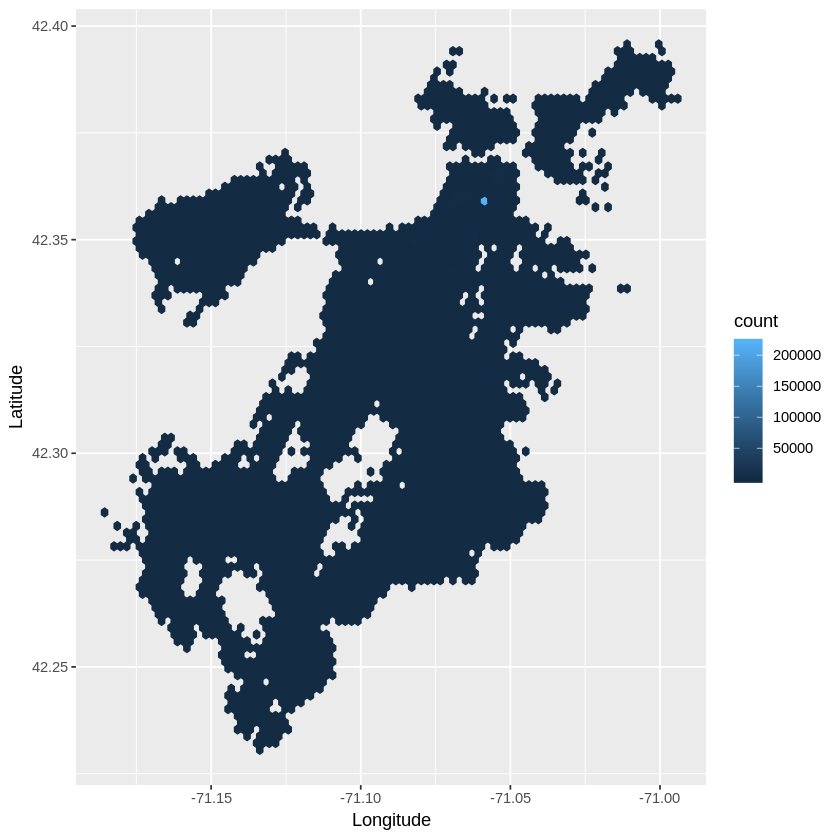

In [19]:
ggplot(dat) +
geom_hex(aes(Longitude, Latitude, col=..count..), 
        bins=90)

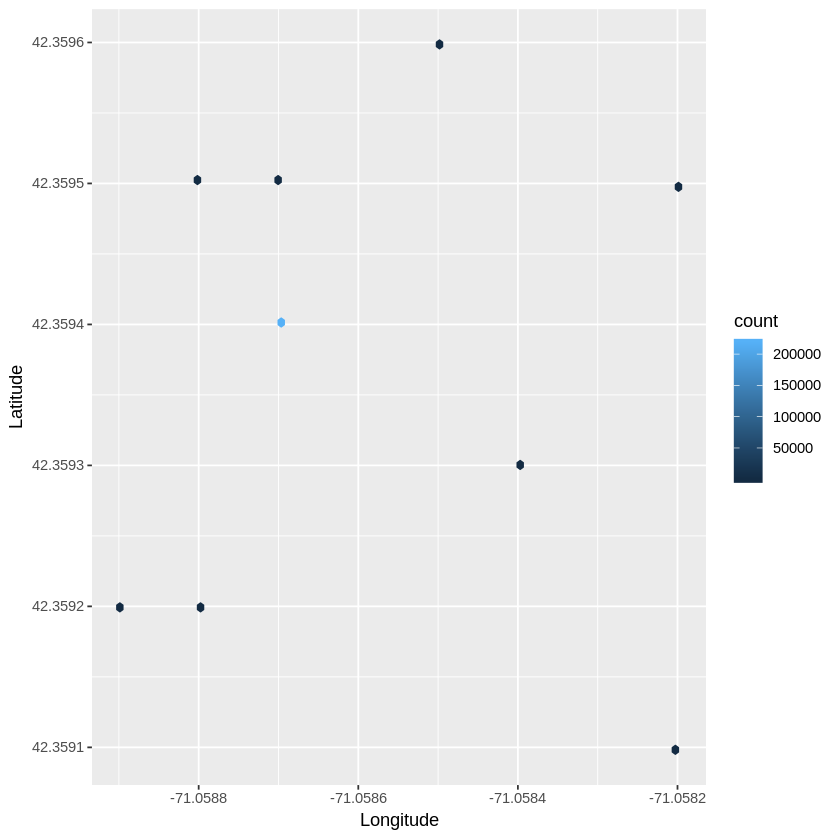

In [27]:
ggplot(dat[dat$Longitude < -71.058 & dat$Longitude > -71.059 & dat$Latitude < 42.36 & dat$Latitude > 42.359,]) +
geom_hex(aes(Longitude, Latitude, col=..count..), 
        bins=90)

In [38]:
length(dat[dat$Latitude==42.3594 & dat$Longitude==-71.0587,1])

[1] 218654

It looks like any report without GPS coordinates gets assigned to City Hall. That's 218,654 reports as of 9/3/2018.

Let's remove City Hall and see how the report density actually varies:

In [30]:
notCityHall <- dat[!(dat$Latitude==42.3594 & dat$Longitude==-71.0587),]

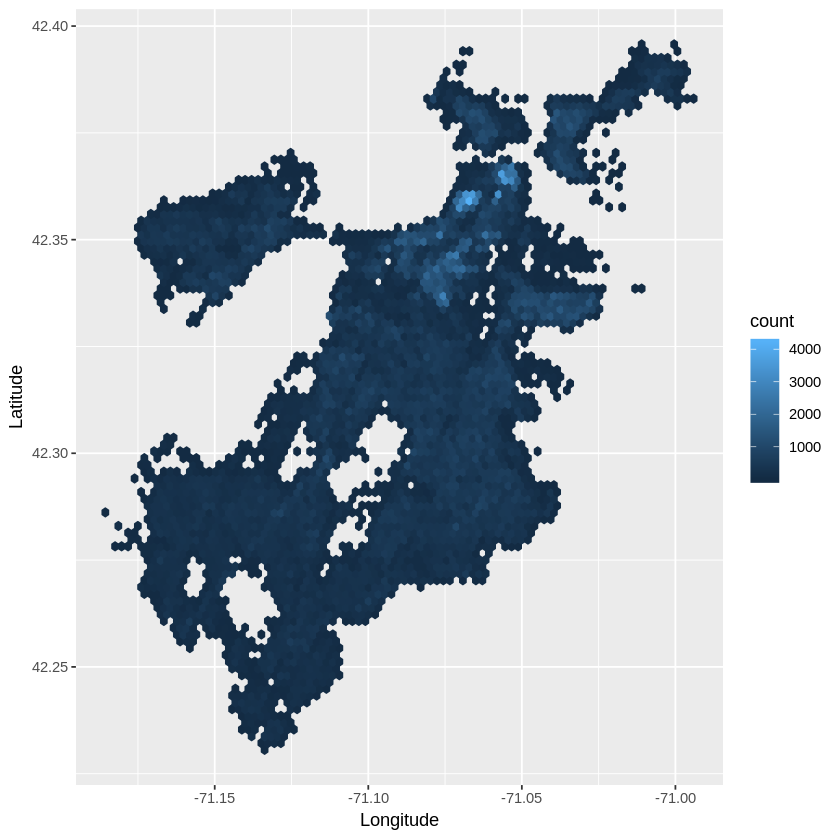

In [114]:
p0 <- ggplot(notCityHall) +
geom_hex(aes(Longitude, Latitude, col=..count..), 
        bins=90)

print(p0)

# Needle pickup requests

In [52]:
needleCases <- notCityHall[grep("Needle", notCityHall$CASE_TITLE), ]

In [55]:
length(needleCases[,1])

[1] 7031

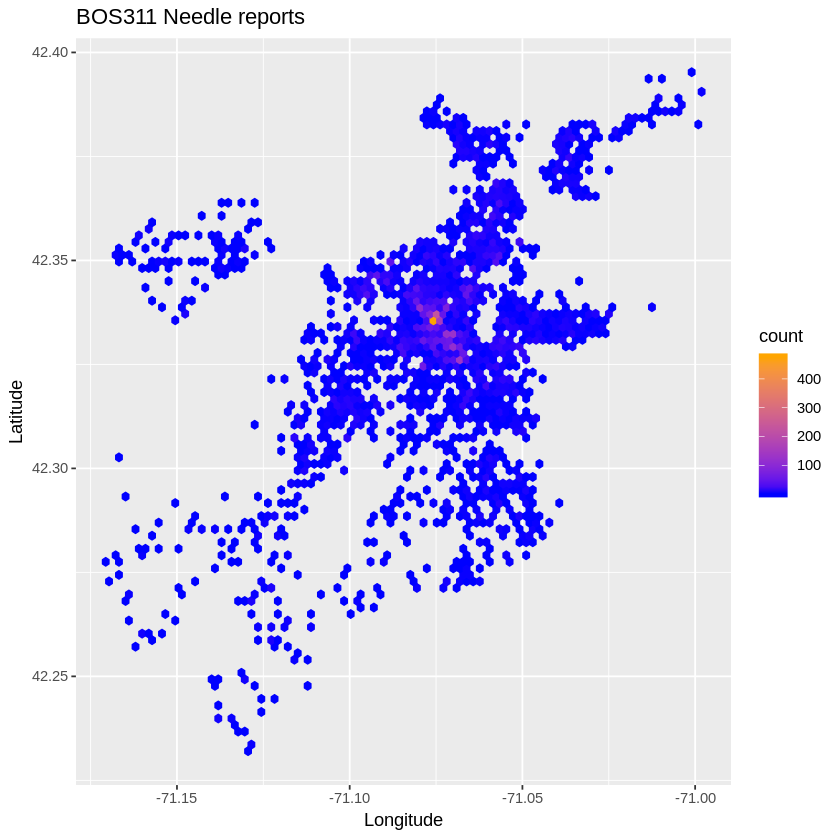

In [88]:
p <- ggplot(needleCases) +
geom_hex(aes(Longitude, Latitude, col=..count..), 
        bins=90) + 
scale_colour_gradient(low = "blue", high = "orange") +
scale_fill_gradient(low = "blue", high = "orange") +
ggtitle("BOS311 Needle reports")
print(p)

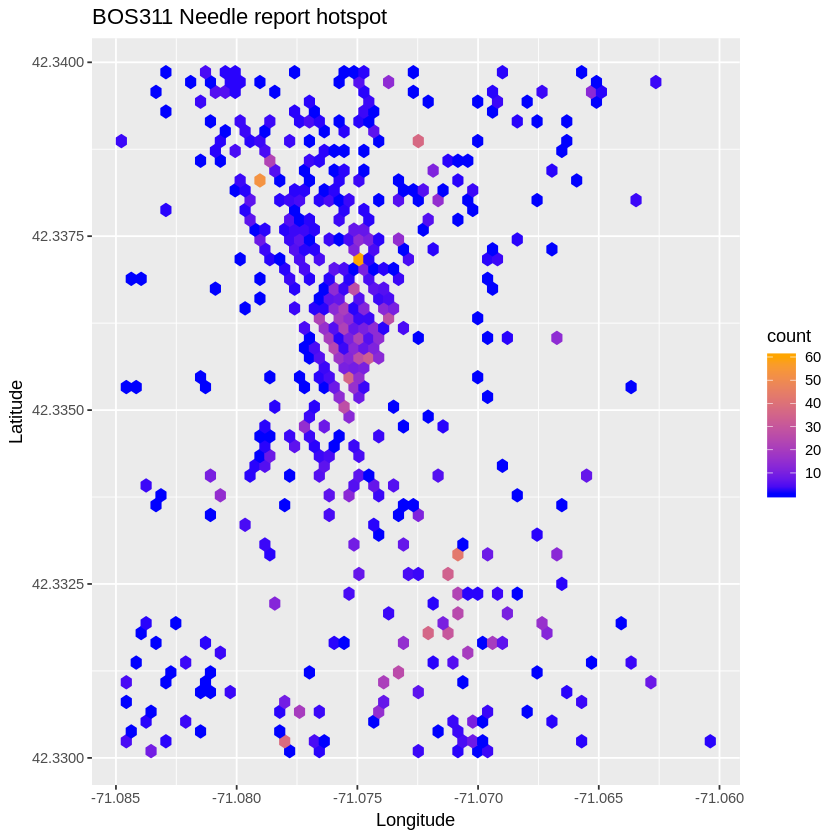

In [160]:
ggplot(needleCases[with(needleCases, Latitude>42.33 & Latitude < 42.34 & Longitude > -71.085 & Longitude < -71.06),]) +
geom_hex(aes(Longitude, Latitude, col=..count..), 
        bins=60) + 
scale_colour_gradient(low = "blue", high = "orange") +
scale_fill_gradient(low = "blue", high = "orange") +
ggtitle("BOS311 Needle report hotspot")

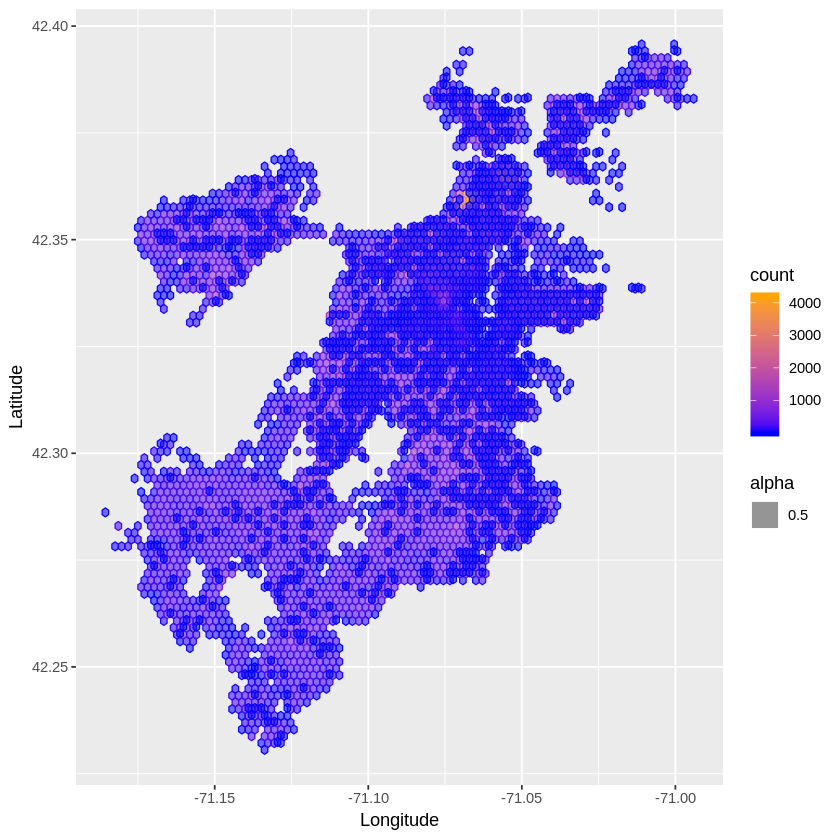

In [161]:
# Note: this is a failed overlay of the generic request density map and the needle pickup map
print(ggplot(notCityHall) + geom_hex(aes(Longitude, Latitude, alpha=0.5, col=..count..), bins=90) +
      geom_hex(data=needleCases, aes(Longitude, Latitude, alpha=0.5, col=..count..), bins=90) +
      scale_colour_gradient(low = "blue", high = "orange") +
      scale_fill_gradient(low = "blue", high = "orange"))

# What else can we plot?

In [159]:
ct <- as.data.frame(xtabs(~TYPE, data=notCityHall))
ct[order(-ct$Freq),]

,TYPE,Freq
153,Schedule a Bulk Item Pickup,101784
112,Parking Enforcement,77597
145,Requests for Street Cleaning,74007
85,Missed Trash/Recycling/Yard Waste/Bulk Item,69377
142,Request for Snow Plowing,57913
140,Request for Pothole Repair,47558
172,Street Light Outages,43773
128,Pothole Repair (Internal),32428
154,Schedule a Bulk Item Pickup SS,29616
184,Tree Maintenance Requests,28388


In [175]:
plotBOS <- function(df, case_title) {
        p <- ggplot(notCityHall[grep(case_title, notCityHall$CASE_TITLE), ]) +
    geom_hex(aes(Longitude, Latitude, col=..count..), 
            bins=90) + 
    scale_colour_gradient(low = "blue", high = "orange") +
    scale_fill_gradient(low = "blue", high = "orange") +
    ggtitle(case_title)
    print(p)
}

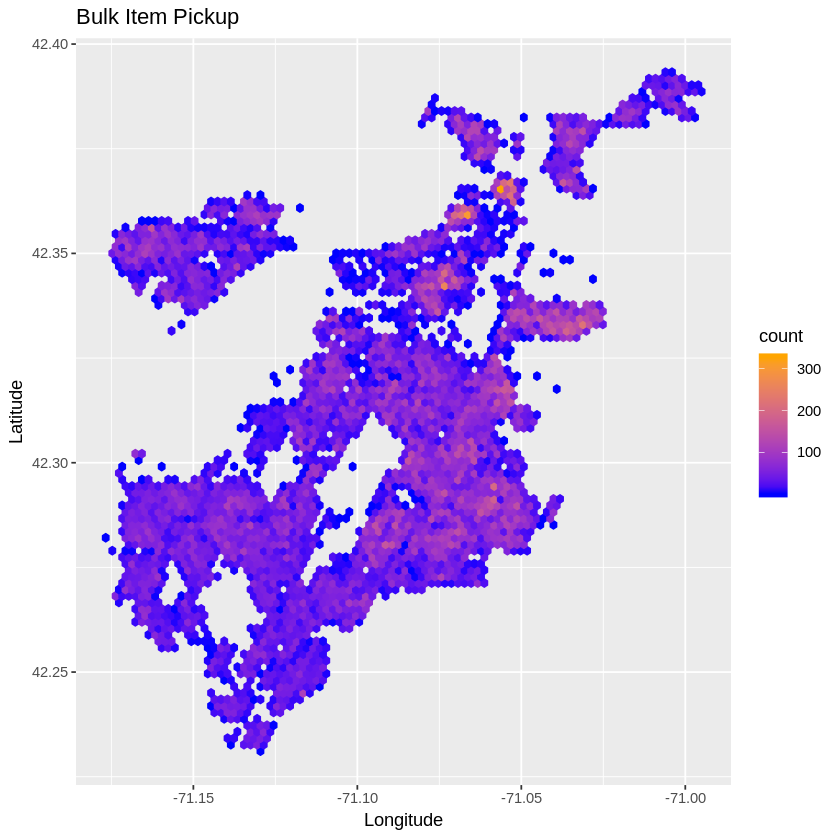

In [166]:
plotBOS(notCityHall, "Bulk Item Pickup")

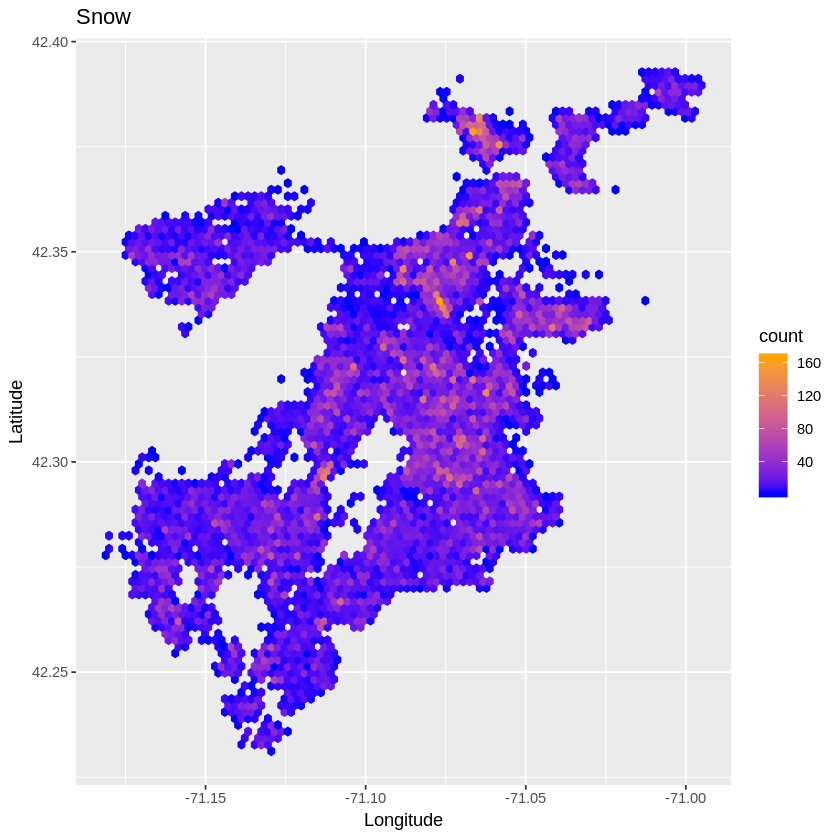

In [180]:
plotBOS(notCityHall, "Snow")

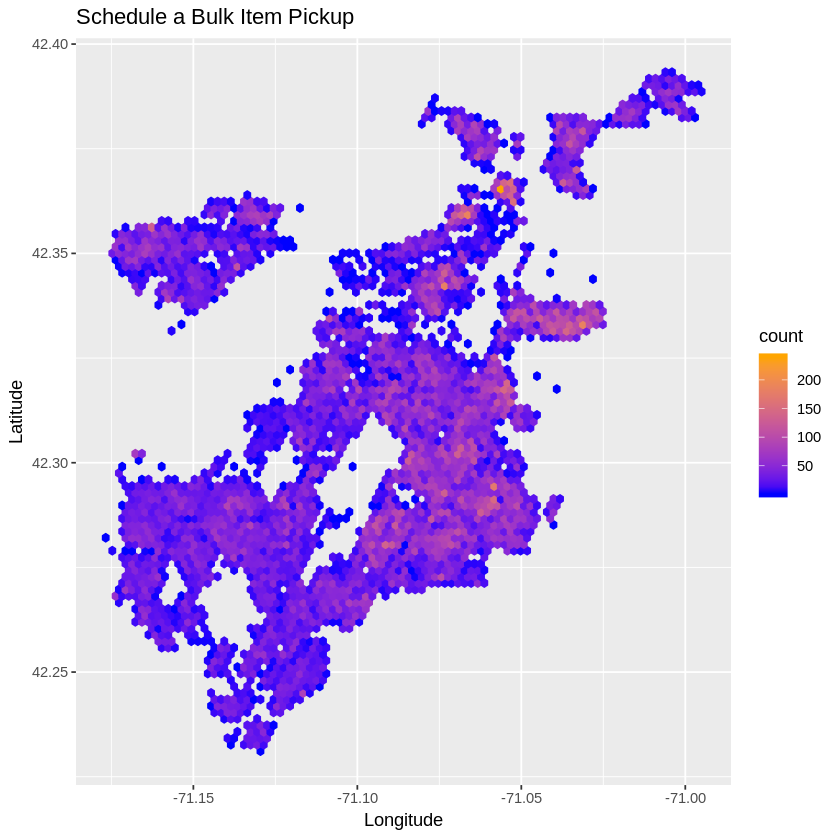

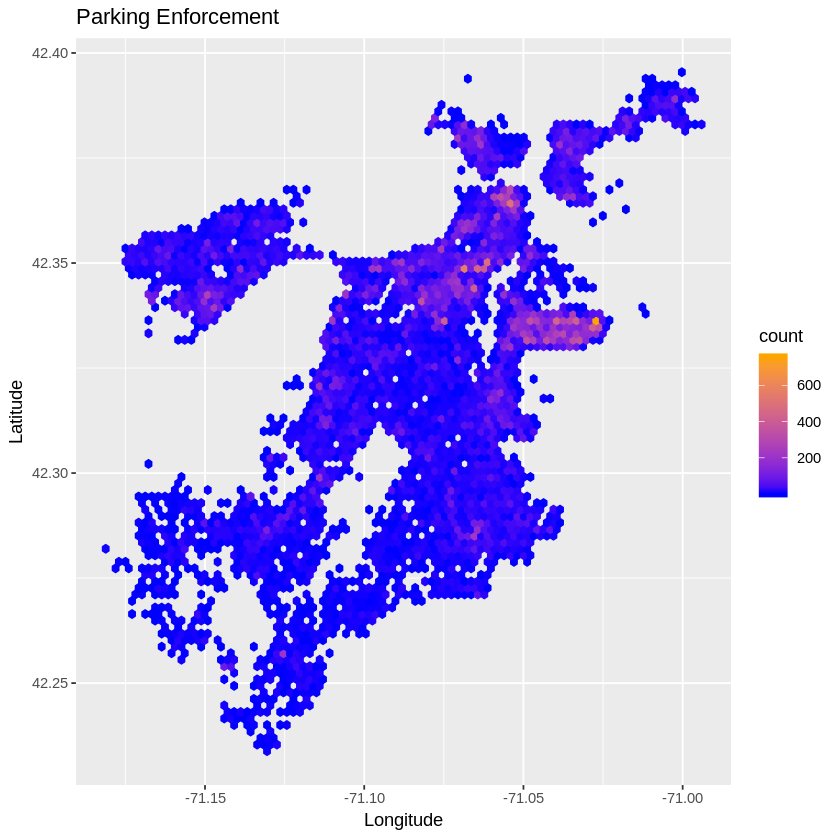

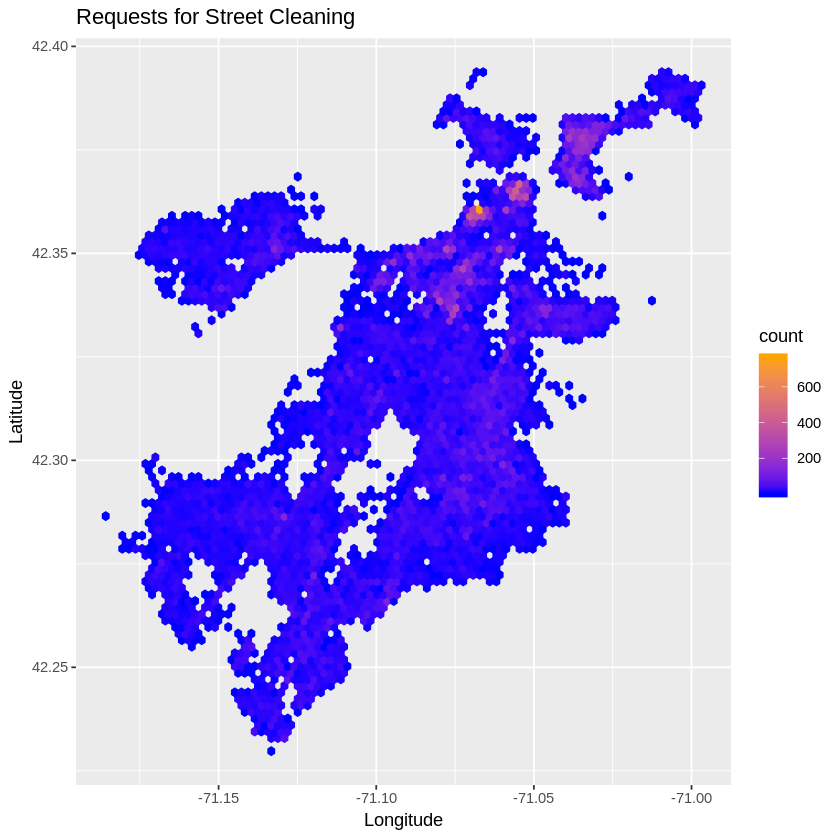

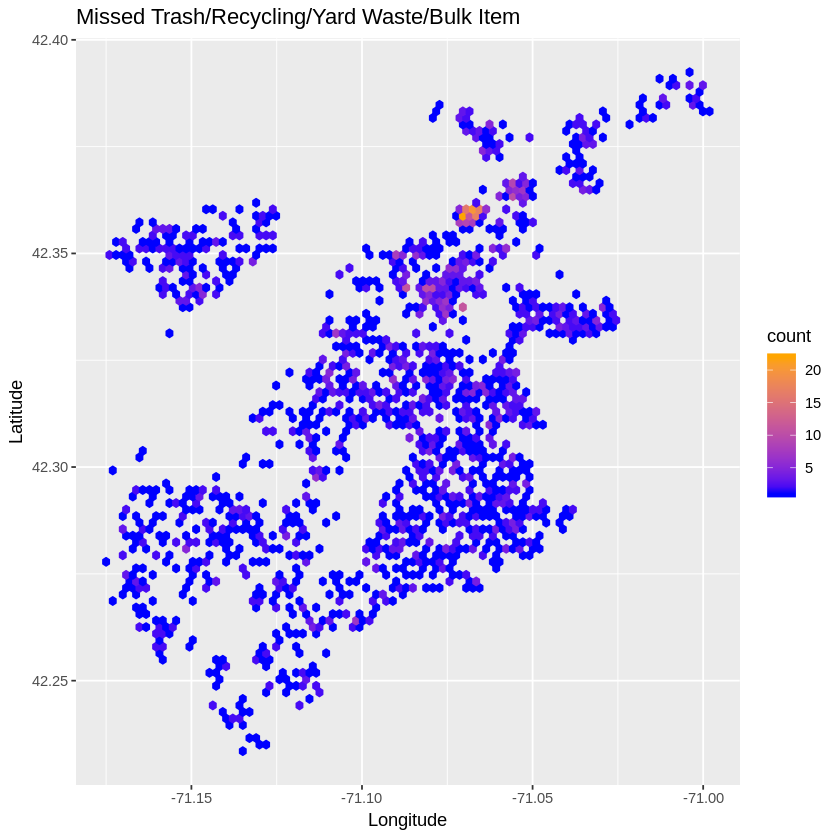

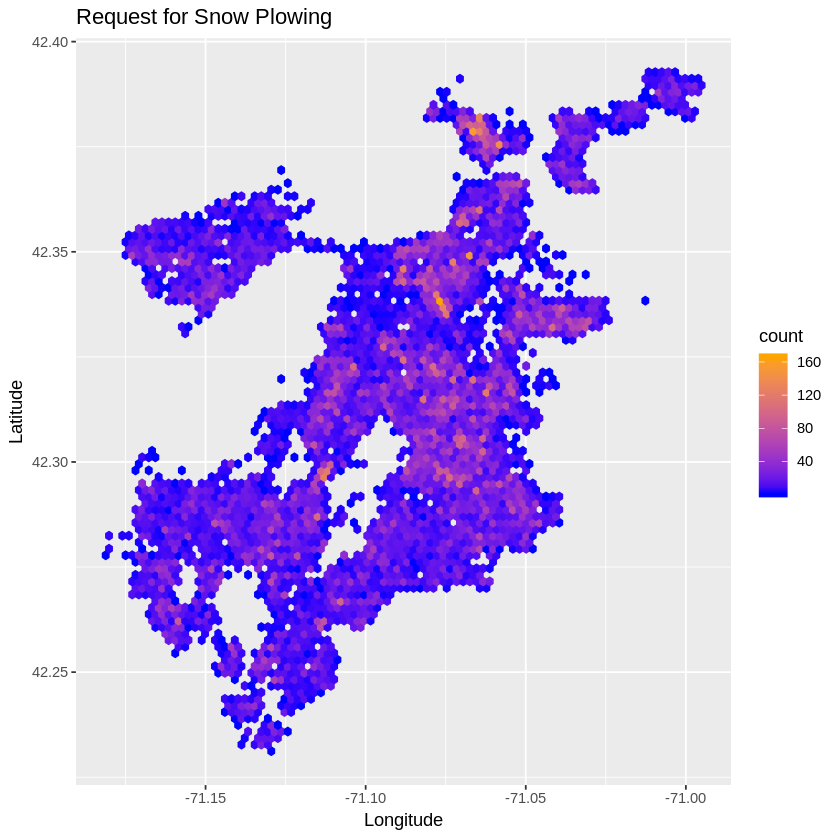

...

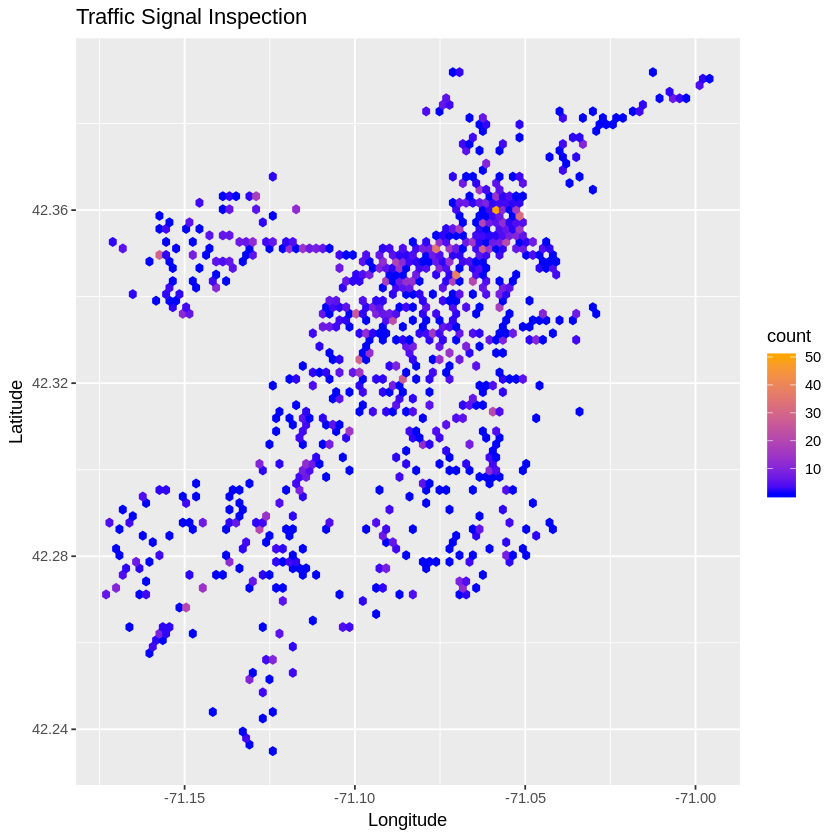

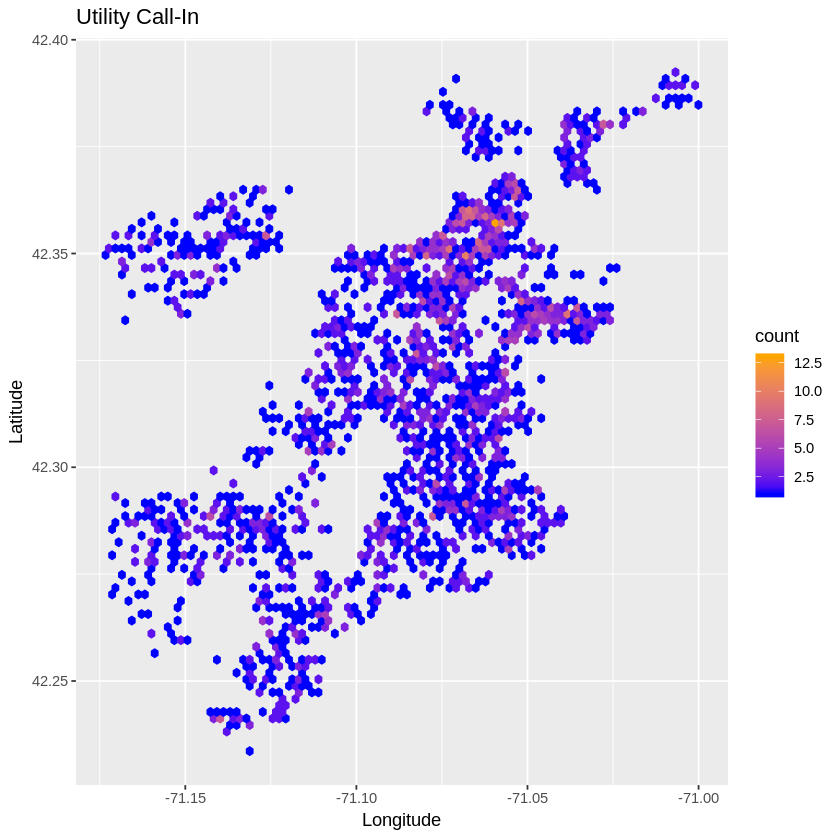

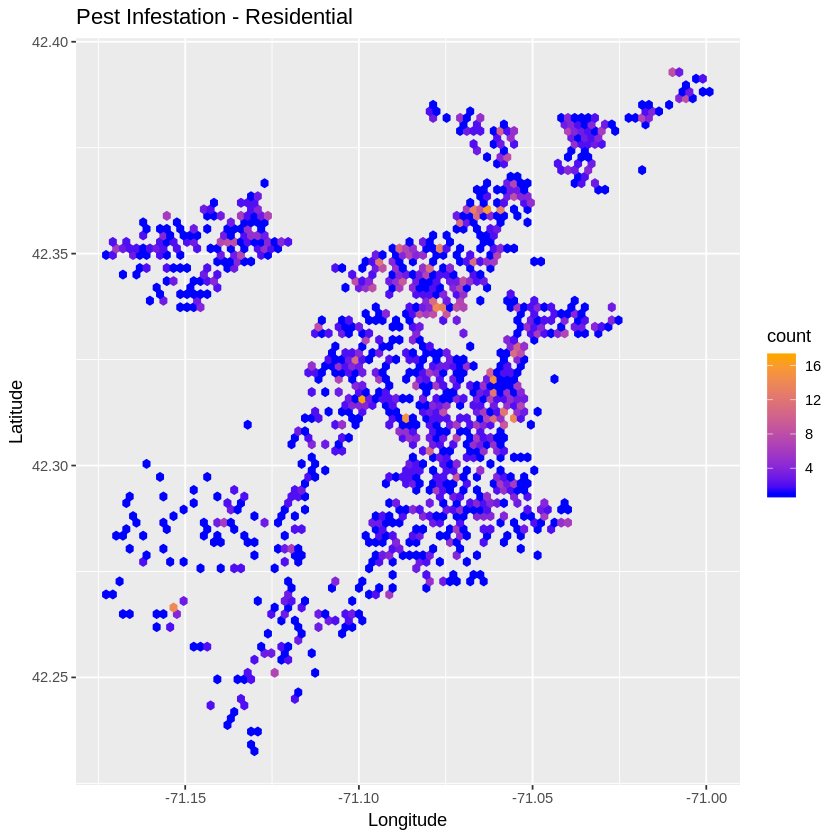

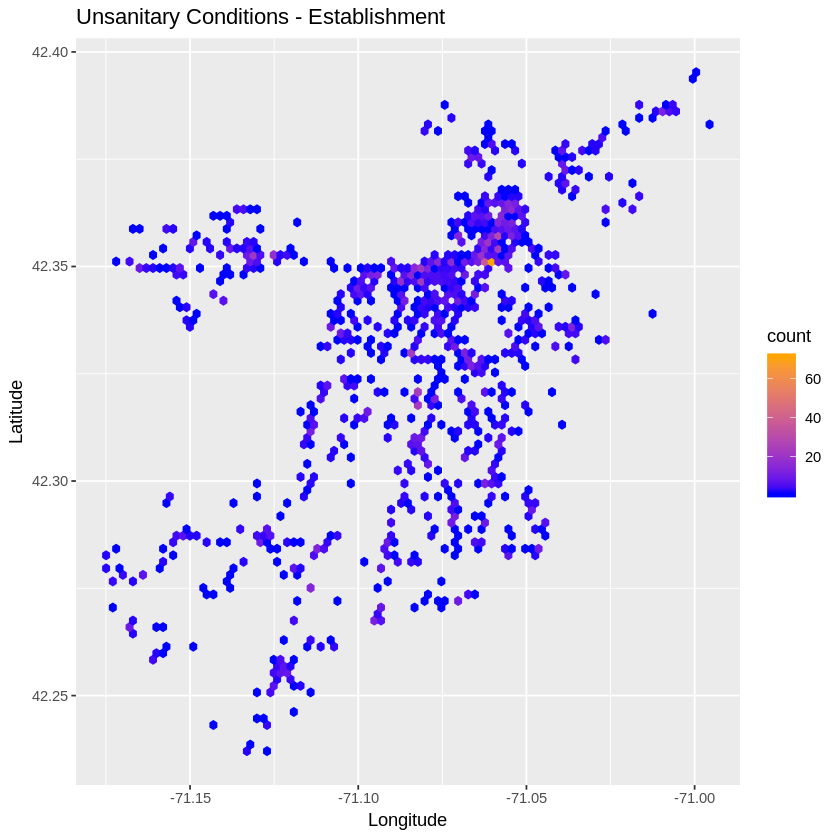

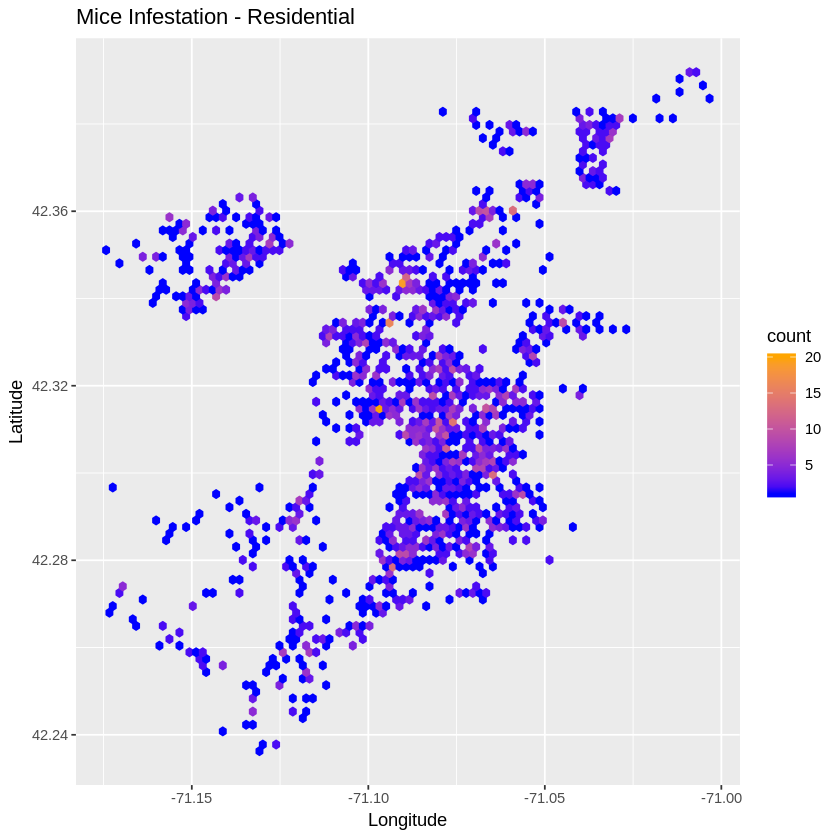

In [182]:
topTypes <- ct[order(-ct$Freq),]$TYPE[seq(1,60)]
for(type in topTypes) {
    plotBOS(notCityHall, type)
}